## ⚡ Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Fri Jun 30 17:45:55 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install YOLO-NAS


In [ ]:
 pip install --upgrade torch torchvision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 2.4 MB/s eta 0:00:00
  Using cached torchvision-0.15.2-cp310-cp310-manylinux1_x86_64.whl (6.0 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 101.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.6/102.6 MB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.2/173.2 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.1/177.1 MB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 kB 12.4 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1
    Uninstalling torch-1.13.1:
      Successfully uninstalled torch-1.13.1
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1
    Uninstalling torchvision-0.14.1:

In [ ]:
!pip install super-gradients
!pip install -q roboflow
!pip install -q supervision

  Using cached pyparsing-2.4.5-py2.py3-none-any.whl (67 kB)
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 2.4.7
    Uninstalling pyparsing-2.4.7:
      Successfully uninstalled pyparsing-2.4.7
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
roboflow 1.1.0 requires pyparsing==2.4.7, but you have pyparsing 2.4.5 which is incompatible.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
super-gradients 3.1.1 requires pyparsing==2.4.5, but you have pyparsing 2.4.7 which is incompatible.


### 🚨 Restart the runtime

**After installation is complete, you'll need to restart the runtime after installation completes. Navigate to `Runtime` -> `Restart runtime` and confirm by clicking `Yes` when you see the popup.**

After that, carry on with the notebook starting from the cell below 👇

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [ ]:
from super_gradients.training import models

model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)

The console stream is logged into /root/sg_logs/console.log


[2023-06-30 17:57:29] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-06-30 17:57:37] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-06-30 17:57:37] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-06-30 17:57:37] WARNING - export.py - Failed to import pytorch_quantization
[2023-06-30 17:57:37] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-06-30 17:57:38] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with thes

  0%|          | 0.00/256M [00:00<?, ?B/s]

### Use Example Data (Below, We'll Prepare Our Own Custom Dataset)

Let's download few example images. Feel free to replace my images with yours. All you have to do is upload them to the `{HOME}/data` directory. If you're looking for data, take a peek at [Roboflow Universe](https://universe.roboflow.com/)! You're sure to find something interesting.

In [ ]:
f"{HOME}/data"

'/content/data'

# Training YOLO-NAS on a Custom Dataset


In [ ]:
LOCATION = '/content/drive/MyDrive/data'
print("location:", LOCATION)
CLASSES = ['rideshare']
print("classes:", CLASSES)

## Fine-tune on custom dataset

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

In [ ]:
project = "rideshare"
# dataset = project.version(1).download("yolov5")


MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 8
MAX_EPOCHS = 25
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.lower().replace(" ", "_")

In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

In [ ]:
ROOT_DIR = '/content/drive/MyDrive/data'
train_imgs_dir = '/content/drive/MyDrive/data/train/images'
train_labels_dir = '/content/drive/MyDrive/data/train/labels'
val_imgs_dir = '/content/drive/MyDrive/data/val/images'
val_labels_dir = '/content/drive/MyDrive/data/val/labels'
test_imgs_dir = '/content/drive/MyDrive/data/test/images'
test_labels_dir = '/content/drive/MyDrive/data/test/labels'
classes = ['rideshare']

dataset_params = {
    'data_dir':ROOT_DIR,
    'train_images_dir':train_imgs_dir,
    'train_labels_dir':train_labels_dir,
    'val_images_dir':val_imgs_dir,
    'val_labels_dir':val_labels_dir,
    'test_images_dir':test_imgs_dir,
    'test_labels_dir':test_labels_dir,
    'classes':classes
}

In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

Caching annotations:  92%|█████████▏| 271/295 [00:13<00:00, 26.86it/s]

**NOTE:** Let's inspect our dataset

In [ ]:
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': [640, 640], 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': [640, 640], 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5, 'max_targets': 120),
 DetectionPaddedRescale('swap': (2, 0, 1),

### Instantiate the model

In [ ]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

[2023-06-30 18:05:55] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


### Define metrics and training parameters

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

### Train the model

In [ ]:
trainer.train(
    model=model,
    training_params=train_params,
    train_loader=train_data,
    valid_loader=val_data
)

[2023-06-30 18:06:03] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-06-30 18:06:07] INFO - utils.py - NumExpr defaulting to 2 threads.


The console stream is now moved to /content/checkpoints/rideshare/console_Jun30_18_06_07.txt


[2023-06-30 18:06:15] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 454        (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         56         (len(train_loader))
    - Gradient updates per epoch:   56         (len(train_loader) / batch_accumulate)

[2023-06-30 18:06:15] INFO - sg_trainer.py - Started training for 25 epochs (0/24)

Validation epoch 0: 100%|██████████| 15/15 [00:07<00:00,  2.05it/s]


SUMMARY OF EPOCH 0
├── Training
│   ├── Ppyoloeloss/loss = 3.7529
│   ├── Ppyoloeloss/loss_cls = 2.0515
│   ├── Ppyoloeloss/loss_dfl = 1.1191
│   └── Ppyoloeloss/loss_iou = 0.4567
└── Validation
    ├── F1@0.50 = 0.0
    ├── Map@0.50 = 0.0
    ├── Ppyoloeloss/loss = 3.5255
    ├── Ppyoloeloss/loss_cls = 2.1284
    ├── Ppyoloeloss/loss_dfl = 0.8826
    ├── Ppyoloeloss/loss_iou = 0.3823
    ├── Precision@0.50 = 0.0
    └── Recall@0.50 = 0.0



[2023-06-30 18:07:37] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:07:37] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 1.1658853509288747e-06
Validation epoch 1: 100%|██████████| 15/15 [00:06<00:00,  2.36it/s]


SUMMARY OF EPOCH 1
├── Training
│   ├── Ppyoloeloss/loss = 2.3927
│   │   ├── Best until now = 3.7529 (↘ -1.3602)
│   │   └── Epoch N-1      = 3.7529 (↘ -1.3602)
│   ├── Ppyoloeloss/loss_cls = 1.2996
│   │   ├── Best until now = 2.0515 (↘ -0.7519)
│   │   └── Epoch N-1      = 2.0515 (↘ -0.7519)
│   ├── Ppyoloeloss/loss_dfl = 0.7115
│   │   ├── Best until now = 1.1191 (↘ -0.4077)
│   │   └── Epoch N-1      = 1.1191 (↘ -0.4077)
│   └── Ppyoloeloss/loss_iou = 0.295
│       ├── Best until now = 0.4567 (↘ -0.1618)
│       └── Epoch N-1      = 0.4567 (↘ -0.1618)
└── Validation
    ├── F1@0.50 = 0.0104
    │   ├── Best until now = 0.0    (↗ 0.0104)
    │   └── Epoch N-1      = 0.0    (↗ 0.0104)
    ├── Map@0.50 = 0.3723
    │   ├── Best until now = 0.0    (↗ 0.3723)
    │   └── Epoch N-1      = 0.0    (↗ 0.3723)
    ├── Ppyoloeloss/loss = 3.4054
    │   ├── Best until now = 3.5255 (↘ -0.1201)
    │   └── Epoch N-1      = 3.5255 (↘ -0.1201)
    ├── Ppyoloeloss/loss_cls = 2.3928
    │   ├── Bes

[2023-06-30 18:09:32] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:09:32] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3722684383392334
Validation epoch 2: 100%|██████████| 15/15 [00:06<00:00,  2.35it/s]


SUMMARY OF EPOCH 2
├── Training
│   ├── Ppyoloeloss/loss = 2.1406
│   │   ├── Best until now = 2.3927 (↘ -0.2521)
│   │   └── Epoch N-1      = 2.3927 (↘ -0.2521)
│   ├── Ppyoloeloss/loss_cls = 1.048
│   │   ├── Best until now = 1.2996 (↘ -0.2516)
│   │   └── Epoch N-1      = 1.2996 (↘ -0.2516)
│   ├── Ppyoloeloss/loss_dfl = 0.695
│   │   ├── Best until now = 0.7115 (↘ -0.0165)
│   │   └── Epoch N-1      = 0.7115 (↘ -0.0165)
│   └── Ppyoloeloss/loss_iou = 0.298
│       ├── Best until now = 0.295  (↗ 0.0031)
│       └── Epoch N-1      = 0.295  (↗ 0.0031)
└── Validation
    ├── F1@0.50 = 0.0445
    │   ├── Best until now = 0.0104 (↗ 0.0341)
    │   └── Epoch N-1      = 0.0104 (↗ 0.0341)
    ├── Map@0.50 = 0.6302
    │   ├── Best until now = 0.3723 (↗ 0.2579)
    │   └── Epoch N-1      = 0.3723 (↗ 0.2579)
    ├── Ppyoloeloss/loss = 2.2838
    │   ├── Best until now = 3.4054 (↘ -1.1216)
    │   └── Epoch N-1      = 3.4054 (↘ -1.1216)
    ├── Ppyoloeloss/loss_cls = 1.3134
    │   ├── Best un

[2023-06-30 18:11:22] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:11:22] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6301611661911011
Validation epoch 3: 100%|██████████| 15/15 [00:07<00:00,  2.10it/s]


SUMMARY OF EPOCH 3
├── Training
│   ├── Ppyoloeloss/loss = 2.0332
│   │   ├── Best until now = 2.1406 (↘ -0.1074)
│   │   └── Epoch N-1      = 2.1406 (↘ -0.1074)
│   ├── Ppyoloeloss/loss_cls = 0.9683
│   │   ├── Best until now = 1.048  (↘ -0.0798)
│   │   └── Epoch N-1      = 1.048  (↘ -0.0798)
│   ├── Ppyoloeloss/loss_dfl = 0.6821
│   │   ├── Best until now = 0.695  (↘ -0.0129)
│   │   └── Epoch N-1      = 0.695  (↘ -0.0129)
│   └── Ppyoloeloss/loss_iou = 0.2896
│       ├── Best until now = 0.295  (↘ -0.0054)
│       └── Epoch N-1      = 0.298  (↘ -0.0085)
└── Validation
    ├── F1@0.50 = 0.0615
    │   ├── Best until now = 0.0445 (↗ 0.017)
    │   └── Epoch N-1      = 0.0445 (↗ 0.017)
    ├── Map@0.50 = 0.709
    │   ├── Best until now = 0.6302 (↗ 0.0788)
    │   └── Epoch N-1      = 0.6302 (↗ 0.0788)
    ├── Ppyoloeloss/loss = 2.4145
    │   ├── Best until now = 2.2838 (↗ 0.1307)
    │   └── Epoch N-1      = 2.2838 (↗ 0.1307)
    ├── Ppyoloeloss/loss_cls = 1.3985
    │   ├── Best un

[2023-06-30 18:13:32] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:13:32] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7089518904685974
Validation epoch 4: 100%|██████████| 15/15 [00:06<00:00,  2.40it/s]


SUMMARY OF EPOCH 4
├── Training
│   ├── Ppyoloeloss/loss = 1.966
│   │   ├── Best until now = 2.0332 (↘ -0.0672)
│   │   └── Epoch N-1      = 2.0332 (↘ -0.0672)
│   ├── Ppyoloeloss/loss_cls = 0.9208
│   │   ├── Best until now = 0.9683 (↘ -0.0475)
│   │   └── Epoch N-1      = 0.9683 (↘ -0.0475)
│   ├── Ppyoloeloss/loss_dfl = 0.6561
│   │   ├── Best until now = 0.6821 (↘ -0.026)
│   │   └── Epoch N-1      = 0.6821 (↘ -0.026)
│   └── Ppyoloeloss/loss_iou = 0.2869
│       ├── Best until now = 0.2896 (↘ -0.0027)
│       └── Epoch N-1      = 0.2896 (↘ -0.0027)
└── Validation
    ├── F1@0.50 = 0.0602
    │   ├── Best until now = 0.0615 (↘ -0.0013)
    │   └── Epoch N-1      = 0.0615 (↘ -0.0013)
    ├── Map@0.50 = 0.7116
    │   ├── Best until now = 0.709  (↗ 0.0026)
    │   └── Epoch N-1      = 0.709  (↗ 0.0026)
    ├── Ppyoloeloss/loss = 2.3596
    │   ├── Best until now = 2.2838 (↗ 0.0758)
    │   └── Epoch N-1      = 2.4145 (↘ -0.0548)
    ├── Ppyoloeloss/loss_cls = 1.4048
    │   ├── Best

[2023-06-30 18:15:30] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:15:30] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7115880846977234
Validation epoch 5: 100%|██████████| 15/15 [00:06<00:00,  2.29it/s]


SUMMARY OF EPOCH 5
├── Training
│   ├── Ppyoloeloss/loss = 1.8911
│   │   ├── Best until now = 1.966  (↘ -0.0749)
│   │   └── Epoch N-1      = 1.966  (↘ -0.0749)
│   ├── Ppyoloeloss/loss_cls = 0.8978
│   │   ├── Best until now = 0.9208 (↘ -0.023)
│   │   └── Epoch N-1      = 0.9208 (↘ -0.023)
│   ├── Ppyoloeloss/loss_dfl = 0.6286
│   │   ├── Best until now = 0.6561 (↘ -0.0275)
│   │   └── Epoch N-1      = 0.6561 (↘ -0.0275)
│   └── Ppyoloeloss/loss_iou = 0.2716
│       ├── Best until now = 0.2869 (↘ -0.0153)
│       └── Epoch N-1      = 0.2869 (↘ -0.0153)
└── Validation
    ├── F1@0.50 = 0.1698
    │   ├── Best until now = 0.0615 (↗ 0.1082)
    │   └── Epoch N-1      = 0.0602 (↗ 0.1096)
    ├── Map@0.50 = 0.7618
    │   ├── Best until now = 0.7116 (↗ 0.0502)
    │   └── Epoch N-1      = 0.7116 (↗ 0.0502)
    ├── Ppyoloeloss/loss = 1.7606
    │   ├── Best until now = 2.2838 (↘ -0.5232)
    │   └── Epoch N-1      = 2.3596 (↘ -0.599)
    ├── Ppyoloeloss/loss_cls = 0.8478
    │   ├── Best 

[2023-06-30 18:17:44] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:17:44] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7618257999420166
Validation epoch 6: 100%|██████████| 15/15 [00:06<00:00,  2.44it/s]


SUMMARY OF EPOCH 6
├── Training
│   ├── Ppyoloeloss/loss = 1.8693
│   │   ├── Best until now = 1.8911 (↘ -0.0218)
│   │   └── Epoch N-1      = 1.8911 (↘ -0.0218)
│   ├── Ppyoloeloss/loss_cls = 0.8721
│   │   ├── Best until now = 0.8978 (↘ -0.0257)
│   │   └── Epoch N-1      = 0.8978 (↘ -0.0257)
│   ├── Ppyoloeloss/loss_dfl = 0.6415
│   │   ├── Best until now = 0.6286 (↗ 0.0129)
│   │   └── Epoch N-1      = 0.6286 (↗ 0.0129)
│   └── Ppyoloeloss/loss_iou = 0.2706
│       ├── Best until now = 0.2716 (↘ -0.001)
│       └── Epoch N-1      = 0.2716 (↘ -0.001)
└── Validation
    ├── F1@0.50 = 0.1033
    │   ├── Best until now = 0.1698 (↘ -0.0665)
    │   └── Epoch N-1      = 0.1698 (↘ -0.0665)
    ├── Map@0.50 = 0.7766
    │   ├── Best until now = 0.7618 (↗ 0.0148)
    │   └── Epoch N-1      = 0.7618 (↗ 0.0148)
    ├── Ppyoloeloss/loss = 1.8118
    │   ├── Best until now = 1.7606 (↗ 0.0511)
    │   └── Epoch N-1      = 1.7606 (↗ 0.0511)
    ├── Ppyoloeloss/loss_cls = 0.8776
    │   ├── Best u

[2023-06-30 18:20:12] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:20:12] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7766266465187073
Validation epoch 7: 100%|██████████| 15/15 [00:07<00:00,  2.13it/s]


SUMMARY OF EPOCH 7
├── Training
│   ├── Ppyoloeloss/loss = 1.8561
│   │   ├── Best until now = 1.8693 (↘ -0.0132)
│   │   └── Epoch N-1      = 1.8693 (↘ -0.0132)
│   ├── Ppyoloeloss/loss_cls = 0.8724
│   │   ├── Best until now = 0.8721 (↗ 0.0002)
│   │   └── Epoch N-1      = 0.8721 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.6361
│   │   ├── Best until now = 0.6286 (↗ 0.0075)
│   │   └── Epoch N-1      = 0.6415 (↘ -0.0055)
│   └── Ppyoloeloss/loss_iou = 0.2663
│       ├── Best until now = 0.2706 (↘ -0.0043)
│       └── Epoch N-1      = 0.2706 (↘ -0.0043)
└── Validation
    ├── F1@0.50 = 0.1578
    │   ├── Best until now = 0.1698 (↘ -0.012)
    │   └── Epoch N-1      = 0.1033 (↗ 0.0544)
    ├── Map@0.50 = 0.816
    │   ├── Best until now = 0.7766 (↗ 0.0394)
    │   └── Epoch N-1      = 0.7766 (↗ 0.0394)
    ├── Ppyoloeloss/loss = 1.6672
    │   ├── Best until now = 1.7606 (↘ -0.0934)
    │   └── Epoch N-1      = 1.8118 (↘ -0.1446)
    ├── Ppyoloeloss/loss_cls = 0.7986
    │   ├── Best u

[2023-06-30 18:23:04] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:23:04] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8159996271133423
Validation epoch 8: 100%|██████████| 15/15 [00:07<00:00,  2.10it/s]


SUMMARY OF EPOCH 8
├── Training
│   ├── Ppyoloeloss/loss = 1.8334
│   │   ├── Best until now = 1.8561 (↘ -0.0228)
│   │   └── Epoch N-1      = 1.8561 (↘ -0.0228)
│   ├── Ppyoloeloss/loss_cls = 0.8532
│   │   ├── Best until now = 0.8721 (↘ -0.0189)
│   │   └── Epoch N-1      = 0.8724 (↘ -0.0191)
│   ├── Ppyoloeloss/loss_dfl = 0.6425
│   │   ├── Best until now = 0.6286 (↗ 0.0139)
│   │   └── Epoch N-1      = 0.6361 (↗ 0.0064)
│   └── Ppyoloeloss/loss_iou = 0.2636
│       ├── Best until now = 0.2663 (↘ -0.0027)
│       └── Epoch N-1      = 0.2663 (↘ -0.0027)
└── Validation
    ├── F1@0.50 = 0.2157
    │   ├── Best until now = 0.1698 (↗ 0.0459)
    │   └── Epoch N-1      = 0.1578 (↗ 0.0579)
    ├── Map@0.50 = 0.8135
    │   ├── Best until now = 0.816  (↘ -0.0025)
    │   └── Epoch N-1      = 0.816  (↘ -0.0025)
    ├── Ppyoloeloss/loss = 1.7628
    │   ├── Best until now = 1.6672 (↗ 0.0956)
    │   └── Epoch N-1      = 1.6672 (↗ 0.0956)
    ├── Ppyoloeloss/loss_cls = 0.8216
    │   ├── Best

Validation epoch 9: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]


SUMMARY OF EPOCH 9
├── Training
│   ├── Ppyoloeloss/loss = 1.7908
│   │   ├── Best until now = 1.8334 (↘ -0.0426)
│   │   └── Epoch N-1      = 1.8334 (↘ -0.0426)
│   ├── Ppyoloeloss/loss_cls = 0.8368
│   │   ├── Best until now = 0.8532 (↘ -0.0164)
│   │   └── Epoch N-1      = 0.8532 (↘ -0.0164)
│   ├── Ppyoloeloss/loss_dfl = 0.6172
│   │   ├── Best until now = 0.6286 (↘ -0.0114)
│   │   └── Epoch N-1      = 0.6425 (↘ -0.0252)
│   └── Ppyoloeloss/loss_iou = 0.2582
│       ├── Best until now = 0.2636 (↘ -0.0054)
│       └── Epoch N-1      = 0.2636 (↘ -0.0054)
└── Validation
    ├── F1@0.50 = 0.1567
    │   ├── Best until now = 0.2157 (↘ -0.0589)
    │   └── Epoch N-1      = 0.2157 (↘ -0.0589)
    ├── Map@0.50 = 0.8529
    │   ├── Best until now = 0.816  (↗ 0.0369)
    │   └── Epoch N-1      = 0.8135 (↗ 0.0394)
    ├── Ppyoloeloss/loss = 1.6632
    │   ├── Best until now = 1.6672 (↘ -0.004)
    │   └── Epoch N-1      = 1.7628 (↘ -0.0996)
    ├── Ppyoloeloss/loss_cls = 0.7791
    │   ├── B

[2023-06-30 18:28:43] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:28:43] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8528846502304077
Validation epoch 10: 100%|██████████| 15/15 [00:06<00:00,  2.34it/s]


SUMMARY OF EPOCH 10
├── Training
│   ├── Ppyoloeloss/loss = 1.7686
│   │   ├── Best until now = 1.7908 (↘ -0.0222)
│   │   └── Epoch N-1      = 1.7908 (↘ -0.0222)
│   ├── Ppyoloeloss/loss_cls = 0.8019
│   │   ├── Best until now = 0.8368 (↘ -0.0349)
│   │   └── Epoch N-1      = 0.8368 (↘ -0.0349)
│   ├── Ppyoloeloss/loss_dfl = 0.6201
│   │   ├── Best until now = 0.6172 (↗ 0.0028)
│   │   └── Epoch N-1      = 0.6172 (↗ 0.0028)
│   └── Ppyoloeloss/loss_iou = 0.2627
│       ├── Best until now = 0.2582 (↗ 0.0045)
│       └── Epoch N-1      = 0.2582 (↗ 0.0045)
└── Validation
    ├── F1@0.50 = 0.0786
    │   ├── Best until now = 0.2157 (↘ -0.1371)
    │   └── Epoch N-1      = 0.1567 (↘ -0.0782)
    ├── Map@0.50 = 0.8061
    │   ├── Best until now = 0.8529 (↘ -0.0468)
    │   └── Epoch N-1      = 0.8529 (↘ -0.0468)
    ├── Ppyoloeloss/loss = 1.8511
    │   ├── Best until now = 1.6632 (↗ 0.1878)
    │   └── Epoch N-1      = 1.6632 (↗ 0.1878)
    ├── Ppyoloeloss/loss_cls = 0.9434
    │   ├── Bes

Validation epoch 11: 100%|██████████| 15/15 [00:07<00:00,  1.97it/s]


SUMMARY OF EPOCH 11
├── Training
│   ├── Ppyoloeloss/loss = 1.6928
│   │   ├── Best until now = 1.7686 (↘ -0.0757)
│   │   └── Epoch N-1      = 1.7686 (↘ -0.0757)
│   ├── Ppyoloeloss/loss_cls = 0.7851
│   │   ├── Best until now = 0.8019 (↘ -0.0168)
│   │   └── Epoch N-1      = 0.8019 (↘ -0.0168)
│   ├── Ppyoloeloss/loss_dfl = 0.614
│   │   ├── Best until now = 0.6172 (↘ -0.0032)
│   │   └── Epoch N-1      = 0.6201 (↘ -0.006)
│   └── Ppyoloeloss/loss_iou = 0.2403
│       ├── Best until now = 0.2582 (↘ -0.0179)
│       └── Epoch N-1      = 0.2627 (↘ -0.0224)
└── Validation
    ├── F1@0.50 = 0.1402
    │   ├── Best until now = 0.2157 (↘ -0.0755)
    │   └── Epoch N-1      = 0.0786 (↗ 0.0616)
    ├── Map@0.50 = 0.8404
    │   ├── Best until now = 0.8529 (↘ -0.0125)
    │   └── Epoch N-1      = 0.8061 (↗ 0.0343)
    ├── Ppyoloeloss/loss = 1.6735
    │   ├── Best until now = 1.6632 (↗ 0.0103)
    │   └── Epoch N-1      = 1.8511 (↘ -0.1776)
    ├── Ppyoloeloss/loss_cls = 0.82
    │   ├── Best

Validation epoch 12: 100%|██████████| 15/15 [00:06<00:00,  2.32it/s]


SUMMARY OF EPOCH 12
├── Training
│   ├── Ppyoloeloss/loss = 1.7174
│   │   ├── Best until now = 1.6928 (↗ 0.0245)
│   │   └── Epoch N-1      = 1.6928 (↗ 0.0245)
│   ├── Ppyoloeloss/loss_cls = 0.8002
│   │   ├── Best until now = 0.7851 (↗ 0.0151)
│   │   └── Epoch N-1      = 0.7851 (↗ 0.0151)
│   ├── Ppyoloeloss/loss_dfl = 0.6192
│   │   ├── Best until now = 0.614  (↗ 0.0051)
│   │   └── Epoch N-1      = 0.614  (↗ 0.0051)
│   └── Ppyoloeloss/loss_iou = 0.243
│       ├── Best until now = 0.2403 (↗ 0.0027)
│       └── Epoch N-1      = 0.2403 (↗ 0.0027)
└── Validation
    ├── F1@0.50 = 0.1378
    │   ├── Best until now = 0.2157 (↘ -0.0779)
    │   └── Epoch N-1      = 0.1402 (↘ -0.0024)
    ├── Map@0.50 = 0.8907
    │   ├── Best until now = 0.8529 (↗ 0.0378)
    │   └── Epoch N-1      = 0.8404 (↗ 0.0503)
    ├── Ppyoloeloss/loss = 1.6768
    │   ├── Best until now = 1.6632 (↗ 0.0136)
    │   └── Epoch N-1      = 1.6735 (↗ 0.0033)
    ├── Ppyoloeloss/loss_cls = 0.8098
    │   ├── Best until

[2023-06-30 18:37:43] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:37:43] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8906736969947815
Validation epoch 13: 100%|██████████| 15/15 [00:07<00:00,  2.02it/s]


SUMMARY OF EPOCH 13
├── Training
│   ├── Ppyoloeloss/loss = 1.7385
│   │   ├── Best until now = 1.6928 (↗ 0.0457)
│   │   └── Epoch N-1      = 1.7174 (↗ 0.0211)
│   ├── Ppyoloeloss/loss_cls = 0.8028
│   │   ├── Best until now = 0.7851 (↗ 0.0177)
│   │   └── Epoch N-1      = 0.8002 (↗ 0.0026)
│   ├── Ppyoloeloss/loss_dfl = 0.6263
│   │   ├── Best until now = 0.614  (↗ 0.0122)
│   │   └── Epoch N-1      = 0.6192 (↗ 0.0071)
│   └── Ppyoloeloss/loss_iou = 0.249
│       ├── Best until now = 0.2403 (↗ 0.0087)
│       └── Epoch N-1      = 0.243  (↗ 0.006)
└── Validation
    ├── F1@0.50 = 0.1817
    │   ├── Best until now = 0.2157 (↘ -0.034)
    │   └── Epoch N-1      = 0.1378 (↗ 0.0439)
    ├── Map@0.50 = 0.8885
    │   ├── Best until now = 0.8907 (↘ -0.0021)
    │   └── Epoch N-1      = 0.8907 (↘ -0.0021)
    ├── Ppyoloeloss/loss = 1.6083
    │   ├── Best until now = 1.6632 (↘ -0.0549)
    │   └── Epoch N-1      = 1.6768 (↘ -0.0685)
    ├── Ppyoloeloss/loss_cls = 0.7483
    │   ├── Best unti

Validation epoch 14: 100%|██████████| 15/15 [00:07<00:00,  2.10it/s]


SUMMARY OF EPOCH 14
├── Training
│   ├── Ppyoloeloss/loss = 1.7098
│   │   ├── Best until now = 1.6928 (↗ 0.017)
│   │   └── Epoch N-1      = 1.7385 (↘ -0.0287)
│   ├── Ppyoloeloss/loss_cls = 0.7879
│   │   ├── Best until now = 0.7851 (↗ 0.0029)
│   │   └── Epoch N-1      = 0.8028 (↘ -0.0149)
│   ├── Ppyoloeloss/loss_dfl = 0.618
│   │   ├── Best until now = 0.614  (↗ 0.0039)
│   │   └── Epoch N-1      = 0.6263 (↘ -0.0083)
│   └── Ppyoloeloss/loss_iou = 0.2452
│       ├── Best until now = 0.2403 (↗ 0.0049)
│       └── Epoch N-1      = 0.249  (↘ -0.0039)
└── Validation
    ├── F1@0.50 = 0.1735
    │   ├── Best until now = 0.2157 (↘ -0.0422)
    │   └── Epoch N-1      = 0.1817 (↘ -0.0082)
    ├── Map@0.50 = 0.9039
    │   ├── Best until now = 0.8907 (↗ 0.0133)
    │   └── Epoch N-1      = 0.8885 (↗ 0.0154)
    ├── Ppyoloeloss/loss = 1.67
    │   ├── Best until now = 1.6083 (↗ 0.0617)
    │   └── Epoch N-1      = 1.6083 (↗ 0.0617)
    ├── Ppyoloeloss/loss_cls = 0.7896
    │   ├── Best unti

[2023-06-30 18:43:44] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:43:44] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.903933584690094
Validation epoch 15: 100%|██████████| 15/15 [00:06<00:00,  2.32it/s]


SUMMARY OF EPOCH 15
├── Training
│   ├── Ppyoloeloss/loss = 1.6484
│   │   ├── Best until now = 1.6928 (↘ -0.0444)
│   │   └── Epoch N-1      = 1.7098 (↘ -0.0614)
│   ├── Ppyoloeloss/loss_cls = 0.7609
│   │   ├── Best until now = 0.7851 (↘ -0.0242)
│   │   └── Epoch N-1      = 0.7879 (↘ -0.027)
│   ├── Ppyoloeloss/loss_dfl = 0.6096
│   │   ├── Best until now = 0.614  (↘ -0.0044)
│   │   └── Epoch N-1      = 0.618  (↘ -0.0083)
│   └── Ppyoloeloss/loss_iou = 0.2331
│       ├── Best until now = 0.2403 (↘ -0.0072)
│       └── Epoch N-1      = 0.2452 (↘ -0.0121)
└── Validation
    ├── F1@0.50 = 0.1159
    │   ├── Best until now = 0.2157 (↘ -0.0998)
    │   └── Epoch N-1      = 0.1735 (↘ -0.0576)
    ├── Map@0.50 = 0.8971
    │   ├── Best until now = 0.9039 (↘ -0.0069)
    │   └── Epoch N-1      = 0.9039 (↘ -0.0069)
    ├── Ppyoloeloss/loss = 1.638
    │   ├── Best until now = 1.6083 (↗ 0.0297)
    │   └── Epoch N-1      = 1.67   (↘ -0.032)
    ├── Ppyoloeloss/loss_cls = 0.7658
    │   ├── B

Validation epoch 16: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]


SUMMARY OF EPOCH 16
├── Training
│   ├── Ppyoloeloss/loss = 1.6641
│   │   ├── Best until now = 1.6484 (↗ 0.0156)
│   │   └── Epoch N-1      = 1.6484 (↗ 0.0156)
│   ├── Ppyoloeloss/loss_cls = 0.7728
│   │   ├── Best until now = 0.7609 (↗ 0.0118)
│   │   └── Epoch N-1      = 0.7609 (↗ 0.0118)
│   ├── Ppyoloeloss/loss_dfl = 0.6087
│   │   ├── Best until now = 0.6096 (↘ -0.0009)
│   │   └── Epoch N-1      = 0.6096 (↘ -0.0009)
│   └── Ppyoloeloss/loss_iou = 0.2348
│       ├── Best until now = 0.2331 (↗ 0.0017)
│       └── Epoch N-1      = 0.2331 (↗ 0.0017)
└── Validation
    ├── F1@0.50 = 0.1183
    │   ├── Best until now = 0.2157 (↘ -0.0974)
    │   └── Epoch N-1      = 0.1159 (↗ 0.0024)
    ├── Map@0.50 = 0.8954
    │   ├── Best until now = 0.9039 (↘ -0.0085)
    │   └── Epoch N-1      = 0.8971 (↘ -0.0017)
    ├── Ppyoloeloss/loss = 1.6272
    │   ├── Best until now = 1.6083 (↗ 0.0189)
    │   └── Epoch N-1      = 1.638  (↘ -0.0108)
    ├── Ppyoloeloss/loss_cls = 0.7978
    │   ├── Best 

Validation epoch 17: 100%|██████████| 15/15 [00:06<00:00,  2.15it/s]


SUMMARY OF EPOCH 17
├── Training
│   ├── Ppyoloeloss/loss = 1.661
│   │   ├── Best until now = 1.6484 (↗ 0.0126)
│   │   └── Epoch N-1      = 1.6641 (↘ -0.003)
│   ├── Ppyoloeloss/loss_cls = 0.7591
│   │   ├── Best until now = 0.7609 (↘ -0.0018)
│   │   └── Epoch N-1      = 0.7728 (↘ -0.0136)
│   ├── Ppyoloeloss/loss_dfl = 0.6029
│   │   ├── Best until now = 0.6087 (↘ -0.0059)
│   │   └── Epoch N-1      = 0.6087 (↘ -0.0059)
│   └── Ppyoloeloss/loss_iou = 0.2402
│       ├── Best until now = 0.2331 (↗ 0.0071)
│       └── Epoch N-1      = 0.2348 (↗ 0.0054)
└── Validation
    ├── F1@0.50 = 0.2402
    │   ├── Best until now = 0.2157 (↗ 0.0246)
    │   └── Epoch N-1      = 0.1183 (↗ 0.1219)
    ├── Map@0.50 = 0.9035
    │   ├── Best until now = 0.9039 (↘ -0.0005)
    │   └── Epoch N-1      = 0.8954 (↗ 0.0081)
    ├── Ppyoloeloss/loss = 1.5779
    │   ├── Best until now = 1.6083 (↘ -0.0305)
    │   └── Epoch N-1      = 1.6272 (↘ -0.0494)
    ├── Ppyoloeloss/loss_cls = 0.7259
    │   ├── Best 

Validation epoch 18: 100%|██████████| 15/15 [00:07<00:00,  1.97it/s]


SUMMARY OF EPOCH 18
├── Training
│   ├── Ppyoloeloss/loss = 1.6456
│   │   ├── Best until now = 1.6484 (↘ -0.0028)
│   │   └── Epoch N-1      = 1.661  (↘ -0.0154)
│   ├── Ppyoloeloss/loss_cls = 0.7574
│   │   ├── Best until now = 0.7591 (↘ -0.0017)
│   │   └── Epoch N-1      = 0.7591 (↘ -0.0017)
│   ├── Ppyoloeloss/loss_dfl = 0.6055
│   │   ├── Best until now = 0.6029 (↗ 0.0026)
│   │   └── Epoch N-1      = 0.6029 (↗ 0.0026)
│   └── Ppyoloeloss/loss_iou = 0.2342
│       ├── Best until now = 0.2331 (↗ 0.0011)
│       └── Epoch N-1      = 0.2402 (↘ -0.006)
└── Validation
    ├── F1@0.50 = 0.1578
    │   ├── Best until now = 0.2402 (↘ -0.0824)
    │   └── Epoch N-1      = 0.2402 (↘ -0.0824)
    ├── Map@0.50 = 0.8901
    │   ├── Best until now = 0.9039 (↘ -0.0139)
    │   └── Epoch N-1      = 0.9035 (↘ -0.0134)
    ├── Ppyoloeloss/loss = 1.5976
    │   ├── Best until now = 1.5779 (↗ 0.0198)
    │   └── Epoch N-1      = 1.5779 (↗ 0.0198)
    ├── Ppyoloeloss/loss_cls = 0.7459
    │   ├── Bes

Validation epoch 19: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]


SUMMARY OF EPOCH 19
├── Training
│   ├── Ppyoloeloss/loss = 1.6438
│   │   ├── Best until now = 1.6456 (↘ -0.0018)
│   │   └── Epoch N-1      = 1.6456 (↘ -0.0018)
│   ├── Ppyoloeloss/loss_cls = 0.7567
│   │   ├── Best until now = 0.7574 (↘ -0.0006)
│   │   └── Epoch N-1      = 0.7574 (↘ -0.0006)
│   ├── Ppyoloeloss/loss_dfl = 0.5939
│   │   ├── Best until now = 0.6029 (↘ -0.009)
│   │   └── Epoch N-1      = 0.6055 (↘ -0.0116)
│   └── Ppyoloeloss/loss_iou = 0.2361
│       ├── Best until now = 0.2331 (↗ 0.003)
│       └── Epoch N-1      = 0.2342 (↗ 0.0018)
└── Validation
    ├── F1@0.50 = 0.1596
    │   ├── Best until now = 0.2402 (↘ -0.0806)
    │   └── Epoch N-1      = 0.1578 (↗ 0.0018)
    ├── Map@0.50 = 0.9053
    │   ├── Best until now = 0.9039 (↗ 0.0014)
    │   └── Epoch N-1      = 0.8901 (↗ 0.0153)
    ├── Ppyoloeloss/loss = 1.6125
    │   ├── Best until now = 1.5779 (↗ 0.0346)
    │   └── Epoch N-1      = 1.5976 (↗ 0.0149)
    ├── Ppyoloeloss/loss_cls = 0.7553
    │   ├── Best u

[2023-06-30 18:59:27] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 18:59:27] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9053335785865784
Validation epoch 20: 100%|██████████| 15/15 [00:06<00:00,  2.34it/s]


SUMMARY OF EPOCH 20
├── Training
│   ├── Ppyoloeloss/loss = 1.5941
│   │   ├── Best until now = 1.6438 (↘ -0.0497)
│   │   └── Epoch N-1      = 1.6438 (↘ -0.0497)
│   ├── Ppyoloeloss/loss_cls = 0.7305
│   │   ├── Best until now = 0.7567 (↘ -0.0263)
│   │   └── Epoch N-1      = 0.7567 (↘ -0.0263)
│   ├── Ppyoloeloss/loss_dfl = 0.5988
│   │   ├── Best until now = 0.5939 (↗ 0.0049)
│   │   └── Epoch N-1      = 0.5939 (↗ 0.0049)
│   └── Ppyoloeloss/loss_iou = 0.2257
│       ├── Best until now = 0.2331 (↘ -0.0074)
│       └── Epoch N-1      = 0.2361 (↘ -0.0104)
└── Validation
    ├── F1@0.50 = 0.2248
    │   ├── Best until now = 0.2402 (↘ -0.0154)
    │   └── Epoch N-1      = 0.1596 (↗ 0.0652)
    ├── Map@0.50 = 0.9156
    │   ├── Best until now = 0.9053 (↗ 0.0102)
    │   └── Epoch N-1      = 0.9053 (↗ 0.0102)
    ├── Ppyoloeloss/loss = 1.5408
    │   ├── Best until now = 1.5779 (↘ -0.0371)
    │   └── Epoch N-1      = 1.6125 (↘ -0.0718)
    ├── Ppyoloeloss/loss_cls = 0.711
    │   ├── Bes

[2023-06-30 19:03:01] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 19:03:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9155538082122803
Validation epoch 21: 100%|██████████| 15/15 [00:07<00:00,  2.00it/s]


SUMMARY OF EPOCH 21
├── Training
│   ├── Ppyoloeloss/loss = 1.568
│   │   ├── Best until now = 1.5941 (↘ -0.0261)
│   │   └── Epoch N-1      = 1.5941 (↘ -0.0261)
│   ├── Ppyoloeloss/loss_cls = 0.7246
│   │   ├── Best until now = 0.7305 (↘ -0.0059)
│   │   └── Epoch N-1      = 0.7305 (↘ -0.0059)
│   ├── Ppyoloeloss/loss_dfl = 0.583
│   │   ├── Best until now = 0.5939 (↘ -0.0109)
│   │   └── Epoch N-1      = 0.5988 (↘ -0.0158)
│   └── Ppyoloeloss/loss_iou = 0.2208
│       ├── Best until now = 0.2257 (↘ -0.0049)
│       └── Epoch N-1      = 0.2257 (↘ -0.0049)
└── Validation
    ├── F1@0.50 = 0.2825
    │   ├── Best until now = 0.2402 (↗ 0.0423)
    │   └── Epoch N-1      = 0.2248 (↗ 0.0577)
    ├── Map@0.50 = 0.9247
    │   ├── Best until now = 0.9156 (↗ 0.0091)
    │   └── Epoch N-1      = 0.9156 (↗ 0.0091)
    ├── Ppyoloeloss/loss = 1.5403
    │   ├── Best until now = 1.5408 (↘ -0.0004)
    │   └── Epoch N-1      = 1.5408 (↘ -0.0004)
    ├── Ppyoloeloss/loss_cls = 0.7113
    │   ├── Bes

[2023-06-30 19:06:29] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 19:06:29] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9246712923049927
Validation epoch 22: 100%|██████████| 15/15 [00:07<00:00,  1.96it/s]


SUMMARY OF EPOCH 22
├── Training
│   ├── Ppyoloeloss/loss = 1.5671
│   │   ├── Best until now = 1.568  (↘ -0.0009)
│   │   └── Epoch N-1      = 1.568  (↘ -0.0009)
│   ├── Ppyoloeloss/loss_cls = 0.7272
│   │   ├── Best until now = 0.7246 (↗ 0.0026)
│   │   └── Epoch N-1      = 0.7246 (↗ 0.0026)
│   ├── Ppyoloeloss/loss_dfl = 0.5954
│   │   ├── Best until now = 0.583  (↗ 0.0124)
│   │   └── Epoch N-1      = 0.583  (↗ 0.0124)
│   └── Ppyoloeloss/loss_iou = 0.2169
│       ├── Best until now = 0.2208 (↘ -0.0039)
│       └── Epoch N-1      = 0.2208 (↘ -0.0039)
└── Validation
    ├── F1@0.50 = 0.2404
    │   ├── Best until now = 0.2825 (↘ -0.0421)
    │   └── Epoch N-1      = 0.2825 (↘ -0.0421)
    ├── Map@0.50 = 0.9448
    │   ├── Best until now = 0.9247 (↗ 0.0202)
    │   └── Epoch N-1      = 0.9247 (↗ 0.0202)
    ├── Ppyoloeloss/loss = 1.5384
    │   ├── Best until now = 1.5403 (↘ -0.002)
    │   └── Epoch N-1      = 1.5403 (↘ -0.002)
    ├── Ppyoloeloss/loss_cls = 0.7123
    │   ├── Best 

[2023-06-30 19:09:53] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/rideshare/ckpt_best.pth
[2023-06-30 19:09:53] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9448498487472534
Validation epoch 23: 100%|██████████| 15/15 [00:06<00:00,  2.35it/s]


SUMMARY OF EPOCH 23
├── Training
│   ├── Ppyoloeloss/loss = 1.5703
│   │   ├── Best until now = 1.5671 (↗ 0.0032)
│   │   └── Epoch N-1      = 1.5671 (↗ 0.0032)
│   ├── Ppyoloeloss/loss_cls = 0.7164
│   │   ├── Best until now = 0.7246 (↘ -0.0081)
│   │   └── Epoch N-1      = 0.7272 (↘ -0.0108)
│   ├── Ppyoloeloss/loss_dfl = 0.597
│   │   ├── Best until now = 0.583  (↗ 0.0139)
│   │   └── Epoch N-1      = 0.5954 (↗ 0.0015)
│   └── Ppyoloeloss/loss_iou = 0.2222
│       ├── Best until now = 0.2169 (↗ 0.0053)
│       └── Epoch N-1      = 0.2169 (↗ 0.0053)
└── Validation
    ├── F1@0.50 = 0.2421
    │   ├── Best until now = 0.2825 (↘ -0.0404)
    │   └── Epoch N-1      = 0.2404 (↗ 0.0017)
    ├── Map@0.50 = 0.9151
    │   ├── Best until now = 0.9448 (↘ -0.0297)
    │   └── Epoch N-1      = 0.9448 (↘ -0.0297)
    ├── Ppyoloeloss/loss = 1.5665
    │   ├── Best until now = 1.5384 (↗ 0.0281)
    │   └── Epoch N-1      = 1.5384 (↗ 0.0281)
    ├── Ppyoloeloss/loss_cls = 0.7268
    │   ├── Best un

Validation epoch 24: 100%|██████████| 15/15 [00:06<00:00,  2.25it/s]


SUMMARY OF EPOCH 24
├── Training
│   ├── Ppyoloeloss/loss = 1.5534
│   │   ├── Best until now = 1.5671 (↘ -0.0137)
│   │   └── Epoch N-1      = 1.5703 (↘ -0.0169)
│   ├── Ppyoloeloss/loss_cls = 0.7232
│   │   ├── Best until now = 0.7164 (↗ 0.0068)
│   │   └── Epoch N-1      = 0.7164 (↗ 0.0068)
│   ├── Ppyoloeloss/loss_dfl = 0.5973
│   │   ├── Best until now = 0.583  (↗ 0.0143)
│   │   └── Epoch N-1      = 0.597  (↗ 0.0004)
│   └── Ppyoloeloss/loss_iou = 0.2126
│       ├── Best until now = 0.2169 (↘ -0.0043)
│       └── Epoch N-1      = 0.2222 (↘ -0.0096)
└── Validation
    ├── F1@0.50 = 0.201
    │   ├── Best until now = 0.2825 (↘ -0.0815)
    │   └── Epoch N-1      = 0.2421 (↘ -0.0411)
    ├── Map@0.50 = 0.9122
    │   ├── Best until now = 0.9448 (↘ -0.0326)
    │   └── Epoch N-1      = 0.9151 (↘ -0.0029)
    ├── Ppyoloeloss/loss = 1.5497
    │   ├── Best until now = 1.5384 (↗ 0.0113)
    │   └── Epoch N-1      = 1.5665 (↘ -0.0168)
    ├── Ppyoloeloss/loss_cls = 0.7269
    │   ├── Bes

[2023-06-30 19:17:26] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validation epoch 25: 100%|██████████| 15/15 [00:06<00:00,  2.18it/s]


SUMMARY OF EPOCH 25
├── Training
│   ├── Ppyoloeloss/loss = 1.5534
│   │   ├── Best until now = 1.5671 (↘ -0.0137)
│   │   └── Epoch N-1      = 1.5703 (↘ -0.0169)
│   ├── Ppyoloeloss/loss_cls = 0.7232
│   │   ├── Best until now = 0.7164 (↗ 0.0068)
│   │   └── Epoch N-1      = 0.7164 (↗ 0.0068)
│   ├── Ppyoloeloss/loss_dfl = 0.5973
│   │   ├── Best until now = 0.583  (↗ 0.0143)
│   │   └── Epoch N-1      = 0.597  (↗ 0.0004)
│   └── Ppyoloeloss/loss_iou = 0.2126
│       ├── Best until now = 0.2169 (↘ -0.0043)
│       └── Epoch N-1      = 0.2222 (↘ -0.0096)
└── Validation
    ├── F1@0.50 = 0.2084
    │   ├── Best until now = 0.2825 (↘ -0.0741)
    │   └── Epoch N-1      = 0.201  (↗ 0.0074)
    ├── Map@0.50 = 0.9413
    │   ├── Best until now = 0.9448 (↘ -0.0035)
    │   └── Epoch N-1      = 0.9122 (↗ 0.0291)
    ├── Ppyoloeloss/loss = 1.5475
    │   ├── Best until now = 1.5384 (↗ 0.0091)
    │   └── Epoch N-1      = 1.5497 (↘ -0.0022)
    ├── Ppyoloeloss/loss_cls = 0.7247
    │   ├── Best

### Analyze training metrics


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

<IPython.core.display.Javascript object>

## Zip and download fine-tuned model

In [ ]:
import locale
print(locale.getpreferredencoding())

import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding



In [ ]:
!cp -r "/content/checkpoints" "/content/drive/MyDrive"

In [ ]:
!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

  adding: content/checkpoints/rideshare/ (stored 0%)
  adding: content/checkpoints/rideshare/logs_Jun30_18_06_07.txt (deflated 89%)
  adding: content/checkpoints/rideshare/events.out.tfevents.1688152654.81dabf3e02e5.3811.1 (deflated 42%)
  adding: content/checkpoints/rideshare/events.out.tfevents.1688148367.81dabf3e02e5.3811.0 (deflated 81%)
  adding: content/checkpoints/rideshare/experiment_logs_Jun30_18_06_07.txt (deflated 74%)
  adding: content/checkpoints/rideshare/average_model.pth (deflated 7%)
  adding: content/checkpoints/rideshare/ckpt_best.pth (deflated 7%)
  adding: content/checkpoints/rideshare/console_Jun30_18_06_07.txt (deflated 93%)
  adding: content/checkpoints/rideshare/ckpt_latest.pth

In [ ]:
# if you experience 'NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968' error, run code below 👇

# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

## Load trained model

In [ ]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path=f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/average_model.pth"
).to(DEVICE)

[2023-06-30 19:39:36] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/rideshare/average_model.pth EMA checkpoint.


## Evaluate trained model

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Test: 100%|██████████| 7/7 [00:03<00:00,  2.70it/s]

{'PPYoloELoss/loss_cls': 0.68517935,
 'PPYoloELoss/loss_iou': 0.19911753,
 'PPYoloELoss/loss_dfl': 0.5630499,
 'PPYoloELoss/loss': 1.464498,
 'Precision@0.50': tensor(0.1098),
 'Recall@0.50': tensor(0.9821),
 'mAP@0.50': tensor(0.9568),
 'F1@0.50': tensor(0.1975)}

Test: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


### Inference with trained model

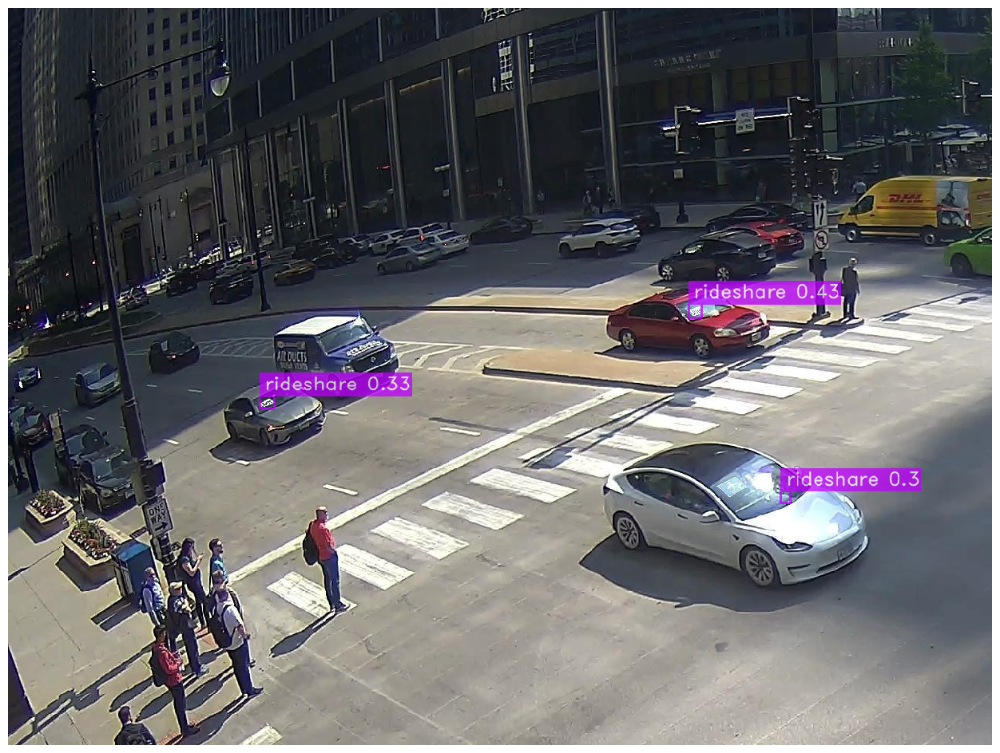

In [56]:
image = '/content/drive/MyDrive/cartest_final.jpg'
best_model.predict( image,  conf=0.3 ).show()


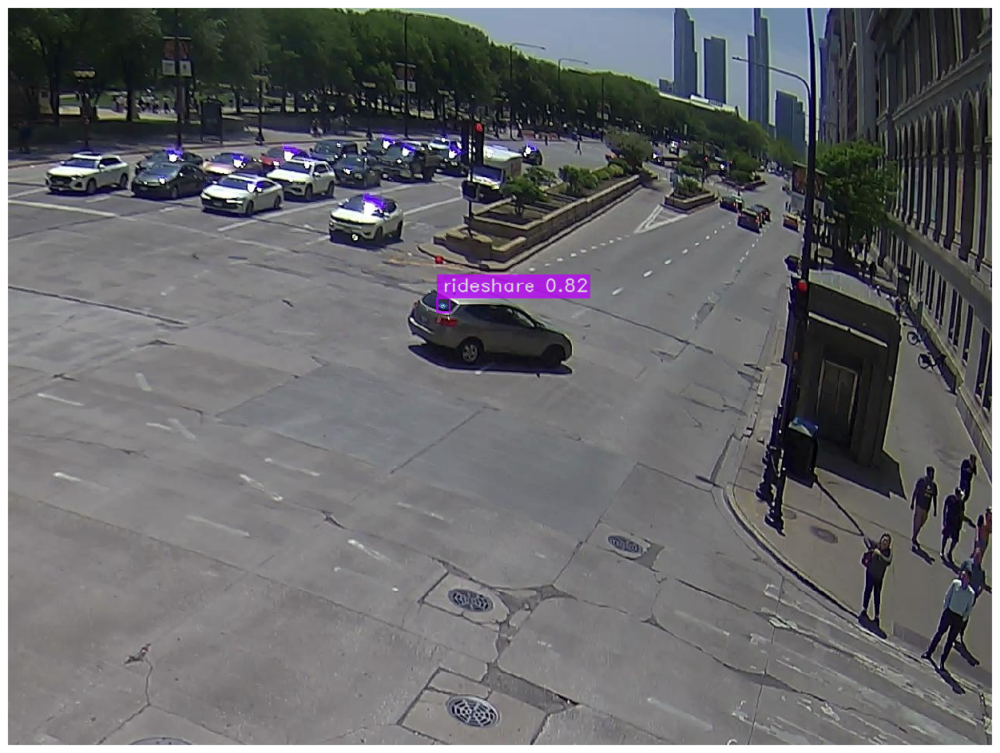

In [69]:
image = '/content/drive/MyDrive/data/test/images/4q2_W07B.jpg'
best_model.predict( image,  conf=0.4 ).show()


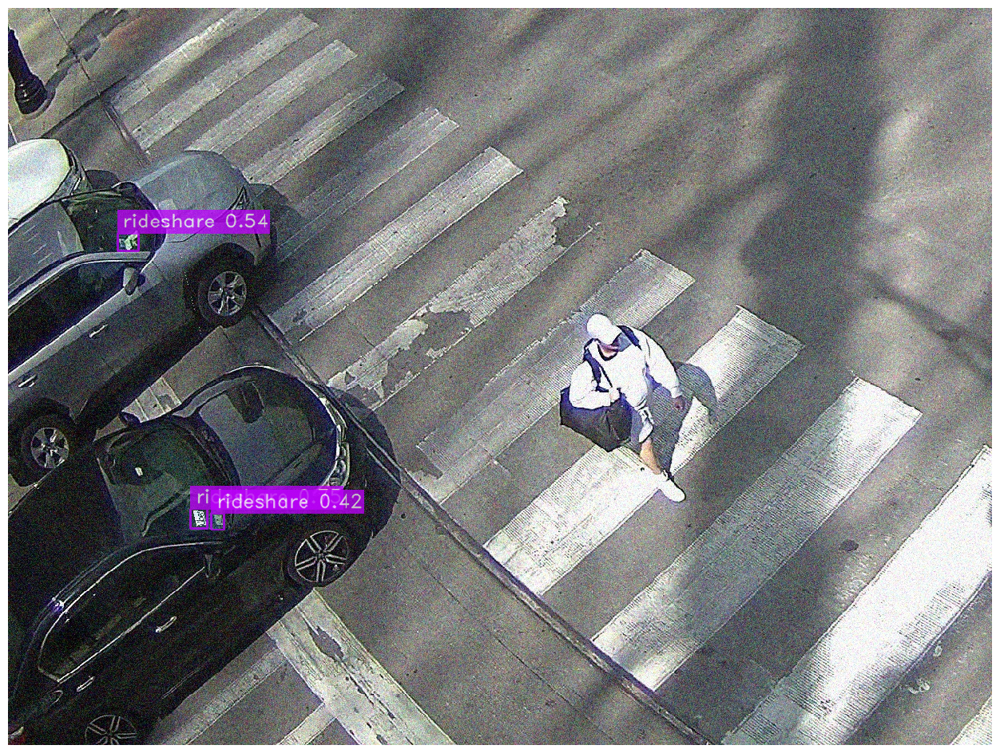

In [72]:
image = "/content/drive/MyDrive/yolov7/yolov7/data/test_noise/31q3.jpg"
best_model.predict( image,  conf=0.4 ).show()


In [74]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path='/content/drive/MyDrive/data/test/images',
    annotations_directory_path='/content/drive/MyDrive/data/test/labels',
    data_yaml_path='/content/drive/MyDrive/data/data.yaml',
    force_masks=False
)

In [75]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

### Visualize inference results

In [76]:
import random
random.seed(10)

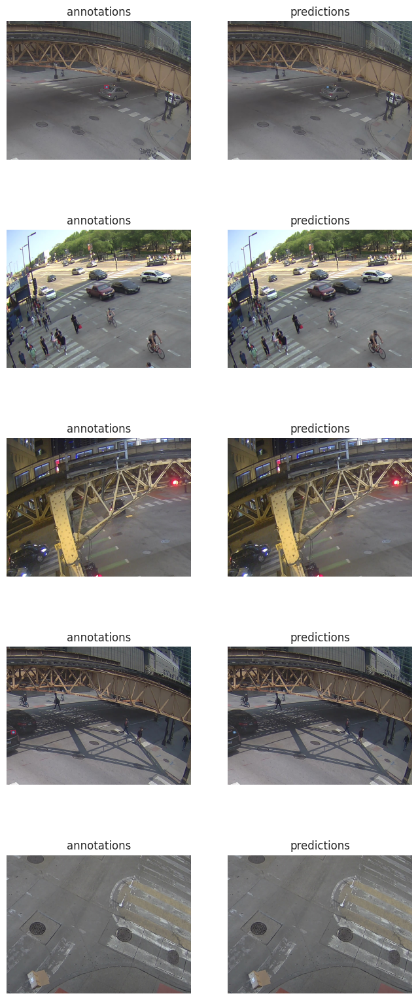

In [77]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(5, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [ ]:
!pip install onemetric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 6.8 MB/s eta 0:00:00


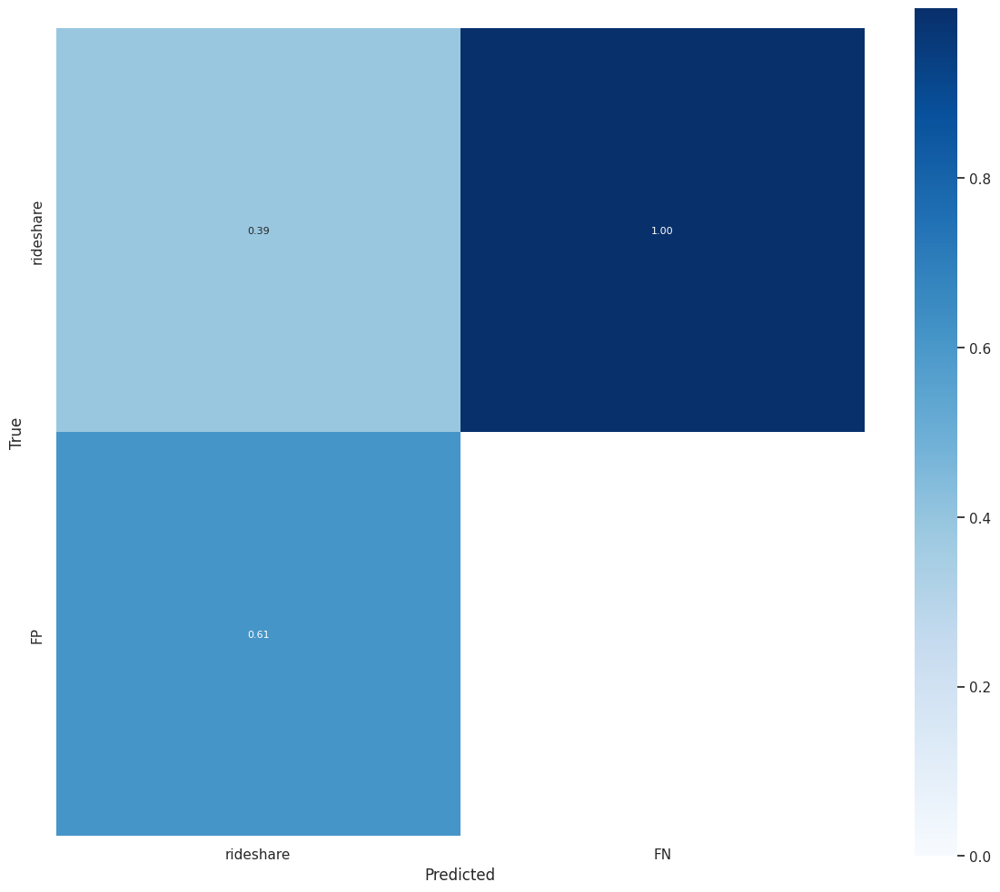

In [78]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)